<a href="https://colab.research.google.com/github/cchang-vassar/Semantic-Relations-in-Vector-Embeddings/blob/main/study1_3_%5Bnomic%5D_pca.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [Nomic] Current Embeddings of Arguments vs. Counterarguments

## Set Up

### Imports

In [ ]:
import os
import re
import subprocess
import zipfile
import shutil
import numpy as np
import pandas as pd
from google.colab import userdata
from enum import Enum
from typing import Optional
from ctypes import Union
from pathlib import Path
import torch

### OSF Setup

In [ ]:
!pip install osfclient

In [ ]:
os.environ["OSF_USERNAME"] = userdata.get("OSF_USERNAME")
OSF_USERNAME = os.environ["OSF_USERNAME"]

In [ ]:
os.environ["OSF_PASSWORD"] = userdata.get("OSF_PASSWORD")
OSF_PASSWORD = os.environ["OSF_PASSWORD"]

In [ ]:
os.environ["OSF_TOKEN"] = userdata.get("OSF_TOKEN")
OSF_TOKEN = os.environ["OSF_TOKEN"]

In [ ]:
os.environ["OSF_PROJECT_ID"] = userdata.get("OSF_PROJECT_ID")
OSF_PROJECT_ID = os.environ["OSF_PROJECT_ID"]

### Nomic Setup

In [ ]:
!pip install nomic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 4.8 MB/s eta 0:00:00
  Created wheel for nomic: filename=nomic-3.0.27-py3-none-any.whl size=44143 sha256=ae550334cf1e254e8325161d84915a5a33355812bbd9a7d0f11167de82aa79a6
  Stored in directory: /root/.cache/pip/wheels/ab/25/ff/c1bed9c1ce0c6e40846a45cec6b3826793f3d89006026ad251
Successfully built nomic


In [ ]:
!pip install sentence_transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 5.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
!pip install einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.2 MB/s eta 0:00:00


In [ ]:
import nomic
from sentence_transformers import SentenceTransformer

### Class Declarations

In [ ]:
# Enum for categories
class TaskType(Enum):
  SEARCH_DOCUMENT = "sd"
  SEARCH_QUERY = "sq"
  CLUSTERING = "clu"
  CLASSIFICATION = "cla"

### Grab data from OSF

In [ ]:
subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/arguments_dump.zip", shell=True)
print("arguments_dump.zip successfully imported")

arguments_dump_file_path_zip = 'arguments_dump.zip'
arguments_dump_file_path = 'current-data-dump/arguments-dump'
with zipfile.ZipFile(arguments_dump_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(arguments_dump_file_path)

extracted_files = os.listdir(arguments_dump_file_path)
print("Files extracted:", extracted_files)

arguments_dump.zip successfully imported
Files extracted: ['test', 'training']


## Load Arguments df

In [ ]:
arguments_data_path = "current-data-dump/arguments-dump/"
loaded_global_training_arguments_df = pd.read_pickle(f"{arguments_data_path}training/global_arguments.pkl")
loaded_global_test_arguments_df = pd.read_pickle(f"{arguments_data_path}test/global_arguments.pkl")

## Get Embeddings

### Generate Nomic Embeddings

In [ ]:
DIM_EMBEDDING = 768
model = SentenceTransformer("nomic-ai/nomic-embed-text-v1.5", trust_remote_code=True)

def _get_embeddings(arguments_df: pd.DataFrame, file_name: str) -> pd.DataFrame:
  arguments_list = list(arguments_df['argument'])

  search_document_embeddings = model.encode(['search_document: ' + argument for argument in arguments_list])
  search_document_df = pd.DataFrame(search_document_embeddings, columns=[f"search_document_{str(i)}" for i in range(DIM_EMBEDDING)])
  embeddings_sd_df = pd.concat([arguments_df, search_document_df], axis=1)

  search_query_embeddings = model.encode(['search_query: ' + argument for argument in arguments_list])
  search_query_df = pd.DataFrame(search_query_embeddings, columns=[f"search_query_{str(i)}" for i in range(DIM_EMBEDDING)])
  embeddings_sq_df = pd.concat([arguments_df, search_query_df], axis=1)

  clustering_embeddings = model.encode(['clustering: ' + argument for argument in arguments_list])
  clustering_df = pd.DataFrame(clustering_embeddings, columns=[f"clustering_{str(i)}" for i in range(DIM_EMBEDDING)])
  embeddings_clu_df = pd.concat([arguments_df, clustering_df], axis=1)

  classification_embeddings = model.encode(['classification: ' + argument for argument in arguments_list])
  classification_df = pd.DataFrame(classification_embeddings, columns=[f"classification_{str(i)}" for i in range(DIM_EMBEDDING)])
  embeddings_cla_df = pd.concat([arguments_df, classification_df], axis=1)

  output_folder = f'current-data-dump/embeddings-dump/'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  sd_output_file_path = f'{output_folder}{file_name}_sd_embeddings.pkl'
  sq_output_file_path = f'{output_folder}{file_name}_sq_embeddings.pkl'
  clu_output_file_path = f'{output_folder}{file_name}_clu_embeddings.pkl'
  cla_output_file_path = f'{output_folder}{file_name}_cla_embeddings.pkl'

  embeddings_sd_df.to_pickle(sd_output_file_path)
  embeddings_sq_df.to_pickle(sq_output_file_path)
  embeddings_clu_df.to_pickle(clu_output_file_path)
  embeddings_cla_df.to_pickle(cla_output_file_path)

  return {
    "embeddings_sd_df": embeddings_sd_df,
    "embeddings_sq_df": embeddings_sq_df,
    "embeddings_clu_df": embeddings_clu_df,
    "embeddings_cla_df": embeddings_cla_df
  }

In [ ]:
training_embeddings_df = _get_embeddings(loaded_global_training_arguments_df, "training")

In [ ]:
test_embeddings_df = _get_embeddings(loaded_global_test_arguments_df, "test")

### Export Embeddings Dump

In [ ]:
embeddings_dump_file_path = 'current-data-dump/embeddings-dump'
embeddings_dump_file_path_zip = 'current-data-dump/embeddings-dump'
shutil.make_archive(embeddings_dump_file_path_zip, 'zip', embeddings_dump_file_path)
print(f"Zip file created at: {embeddings_dump_file_path_zip}")
result = subprocess.run([f"osf -p sakjg upload --force {embeddings_dump_file_path_zip}.zip data-dump/nomic-autoencoder/nomic_embeddings_dump.zip"], shell=True, capture_output=True, text=True)
print(result.stderr)
print(f"File: {embeddings_dump_file_path_zip} uploaded at osfstorage")

Zip file created at: current-data-dump/embeddings-dump

File: current-data-dump/embeddings-dump uploaded at osfstorage


### Import Embeddings Dump

In [ ]:
subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_embeddings_dump.zip", shell=True)
print("nomic_embeddings_dump.zip successfully imported")

nomic_embeddings_dump_file_path_zip = 'nomic_embeddings_dump.zip'
nomic_embeddings_dump_file_path = 'current-data-dump/embeddings-dump'
with zipfile.ZipFile(nomic_embeddings_dump_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(nomic_embeddings_dump_file_path)

extracted_files = os.listdir(nomic_embeddings_dump_file_path)
print("Files extracted:", extracted_files)

nomic_embeddings_dump.zip successfully imported
Files extracted: ['global_sd_embeddings.pkl', 'global_cla_embeddings.pkl', 'global_clu_embeddings.pkl', 'global_sq_embeddings.pkl']


## Analyze Nomic Embeddings

### Import Nomic Embeddings

In [ ]:
embeddings_data_path = "current-data-dump/embeddings-dump/"
loaded_global_embeddings_sd_df = pd.read_pickle(f"{embeddings_data_path}global_sd_embeddings.pkl")
loaded_global_embeddings_sq_df = pd.read_pickle(f"{embeddings_data_path}global_sq_embeddings.pkl")
loaded_global_embeddings_clu_df = pd.read_pickle(f"{embeddings_data_path}global_clu_embeddings.pkl")
loaded_global_embeddings_cla_df = pd.read_pickle(f"{embeddings_data_path}global_cla_embeddings.pkl")

In [ ]:
loaded_shuffled_global_embeddings_sd_df_point = loaded_global_embeddings_sd_df.copy()
loaded_shuffled_global_embeddings_sd_df_counter = loaded_global_embeddings_sd_df.copy()
loaded_shuffled_global_embeddings_sd_df_point = loaded_shuffled_global_embeddings_sd_df_point[loaded_shuffled_global_embeddings_sd_df_point['type'] == 'point']
loaded_shuffled_global_embeddings_sd_df_counter = loaded_shuffled_global_embeddings_sd_df_counter[loaded_shuffled_global_embeddings_sd_df_counter['type'] == 'counter']

def shuffle_group(data):
    return np.random.permutation(data.values)

loaded_shuffled_global_embeddings_sd_df_counter['pair_id'] = loaded_shuffled_global_embeddings_sd_df_counter.groupby('topic')['pair_id'].transform(shuffle_group)
loaded_shuffled_global_embeddings_sd_df = pd.concat([loaded_shuffled_global_embeddings_sd_df_point, loaded_shuffled_global_embeddings_sd_df_counter], axis=0)

In [ ]:
loaded_shuffled_global_embeddings_sq_df_point = loaded_global_embeddings_sq_df.copy()
loaded_shuffled_global_embeddings_sq_df_counter = loaded_global_embeddings_sq_df.copy()
loaded_shuffled_global_embeddings_sq_df_point = loaded_shuffled_global_embeddings_sq_df_point[loaded_shuffled_global_embeddings_sq_df_point['type'] == 'point']
loaded_shuffled_global_embeddings_sq_df_counter = loaded_shuffled_global_embeddings_sq_df_counter[loaded_shuffled_global_embeddings_sq_df_counter['type'] == 'counter']

def shuffle_group(data):
    return np.random.permutation(data.values)

loaded_shuffled_global_embeddings_sq_df_counter['pair_id'] = loaded_shuffled_global_embeddings_sq_df_counter.groupby('topic')['pair_id'].transform(shuffle_group)
loaded_shuffled_global_embeddings_sq_df = pd.concat([loaded_shuffled_global_embeddings_sq_df_point, loaded_shuffled_global_embeddings_sq_df_counter], axis=0)

In [ ]:
loaded_shuffled_global_embeddings_clu_df_point = loaded_global_embeddings_clu_df.copy()
loaded_shuffled_global_embeddings_clu_df_counter = loaded_global_embeddings_clu_df.copy()
loaded_shuffled_global_embeddings_clu_df_point = loaded_shuffled_global_embeddings_clu_df_point[loaded_shuffled_global_embeddings_clu_df_point['type'] == 'point']
loaded_shuffled_global_embeddings_clu_df_counter = loaded_shuffled_global_embeddings_clu_df_counter[loaded_shuffled_global_embeddings_clu_df_counter['type'] == 'counter']

def shuffle_group(data):
    return np.random.permutation(data.values)

loaded_shuffled_global_embeddings_clu_df_counter['pair_id'] = loaded_shuffled_global_embeddings_clu_df_counter.groupby('topic')['pair_id'].transform(shuffle_group)
loaded_shuffled_global_embeddings_clu_df = pd.concat([loaded_shuffled_global_embeddings_clu_df_point, loaded_shuffled_global_embeddings_clu_df_counter], axis=0)

In [ ]:
loaded_shuffled_global_embeddings_cla_df_point = loaded_global_embeddings_cla_df.copy()
loaded_shuffled_global_embeddings_cla_df_counter = loaded_global_embeddings_cla_df.copy()
loaded_shuffled_global_embeddings_cla_df_point = loaded_shuffled_global_embeddings_cla_df_point[loaded_shuffled_global_embeddings_cla_df_point['type'] == 'point']
loaded_shuffled_global_embeddings_cla_df_counter = loaded_shuffled_global_embeddings_cla_df_counter[loaded_shuffled_global_embeddings_cla_df_counter['type'] == 'counter']

def shuffle_group(data):
    return np.random.permutation(data.values)

loaded_shuffled_global_embeddings_cla_df_counter['pair_id'] = loaded_shuffled_global_embeddings_cla_df_counter.groupby('topic')['pair_id'].transform(shuffle_group)
loaded_shuffled_global_embeddings_cla_df = pd.concat([loaded_shuffled_global_embeddings_cla_df_point, loaded_shuffled_global_embeddings_cla_df_counter], axis=0)

### Imports for analyzing embeddings

In [ ]:
import joblib
from sklearn.decomposition import PCA

### Functions for analyzing embeddings

In [ ]:
def _analysis_write_to_file(
    analysis_data: pd.DataFrame,
    pca: PCA,
    task_type: TaskType,
    file_name: str='global'
  ):
  """Write analysis results to pickle file"""
  output_folder = f'current-data-dump/pca-dump/'
  output_file_path = f'{output_folder}{file_name}_{task_type.value}_pca.pkl'
  pca_file_path = f'{output_folder}{file_name}_{task_type.value}_pca_obj.pkl'

  os.makedirs(output_folder, exist_ok=True)
  analysis_data.to_pickle(output_file_path)
  joblib.dump(pca, pca_file_path)

In [ ]:
def _pca_normalization(pair_df: pd.DataFrame) -> pd.DataFrame:
  """Normalize PCA argument embeddings from a df"""
  ret_df = pd.DataFrame()

  point_row = pair_df[pair_df['type'] == 'point']
  counter_row = pair_df[pair_df['type'] == 'counter']

  point_nonnum_row = point_row.select_dtypes(exclude=[np.number])
  counter_nonnum_row = counter_row.select_dtypes(exclude=[np.number])
  new_nonnum_rows = pd.concat([point_nonnum_row, counter_nonnum_row])
  new_nonnum_rows = new_nonnum_rows.reset_index(drop=True)

  point_vec = point_row.select_dtypes(include=[np.number]).values.flatten()
  counter_vec = counter_row.select_dtypes(include=[np.number]).values.flatten()

  center = (point_vec.copy() + counter_vec.copy()) / 2
  point_vec -= center
  counter_vec -= center
  point_vec = point_vec.flatten()
  counter_vec = counter_vec.flatten()

  point_new_num_row = pd.DataFrame(point_vec.reshape(1,-1), columns=['{}'.format(i) for i in range(len(point_vec))])
  counter_new_num_row = pd.DataFrame(counter_vec.reshape(1,-1), columns=['{}'.format(i) for i in range(len(counter_vec))])
  new_num_rows = pd.concat([point_new_num_row, counter_new_num_row])
  new_num_rows = new_num_rows.reset_index(drop=True)
  return new_nonnum_rows.join(new_num_rows)

In [ ]:
def _pca_preprocessing(embeddings_df: pd.DataFrame) -> pd.DataFrame:
  if len(embeddings_df) % 2 != 0:
    print("Warning: embeddings_df not in pairs")
  embeddings_ret_df = pd.DataFrame()
  topics = list(embeddings_df['topic'].unique())

  for topic in topics:
    topic_rows = embeddings_df[embeddings_df['topic'] == topic]
    if len(topic_rows) % 2 != 0:
      print(f"Warning: Topic '{topic}' has {len(topic_rows)} rows.")
    pair_ids = list(topic_rows['pair_id'].unique())

    for pair_id in pair_ids:
      pair_df = topic_rows[topic_rows['pair_id'] == pair_id]
      if len(pair_df) != 2:
        print(f"Warning: Pair {pair_id} at topic '{topic}' has {len(pair_df)} rows.")
        continue
      embeddings_ret_df = pd.concat([embeddings_ret_df, _pca_normalization(pair_df)])
      embeddings_ret_df = embeddings_ret_df.reset_index(drop=True)
  return embeddings_ret_df

In [ ]:
def pca_embeddings(
    embeddings_df: pd.DataFrame,
    num_components: int,
    task_type: TaskType,
    file_name: str='global'
  ):
  embeddings_processed = _pca_preprocessing(embeddings_df)
  numeric_columns = embeddings_processed.select_dtypes(include=[np.number]).columns
  non_numeric_columns = embeddings_processed.select_dtypes(exclude=[np.number]).columns
  embeddings_data = embeddings_processed[numeric_columns].values

  num_components = min(num_components, embeddings_data.shape[0], embeddings_data.shape[1])
  pca = PCA(n_components=num_components)
  embeddings_pca = pca.fit_transform(embeddings_data)
  embeddings_pca_data = (
    pd.DataFrame(embeddings_pca, columns=['pca_{}'.format(i) for i in range(num_components)])
    .join(embeddings_processed[non_numeric_columns].reset_index(drop=True))
  )

  # Printing PCA attributes
  components = pca.components_
  explained_variance = pca.explained_variance_
  explained_variance_ratio = pca.explained_variance_ratio_
  singular_values = pca.singular_values_
  mean_value = pca.mean_
  n_components = pca.n_components_
  n_features = pca.n_features_in_
  n_samples = pca.n_samples_

  # Displaying the attributes
  print("Components:")
  print(components)
  print("\nExplained Variance:")
  print(explained_variance)
  print("\nExplained Variance Ratio:")
  print(explained_variance_ratio)
  print("\nSingular Values:")
  print(singular_values)
  print("\nMean:")
  print(mean_value)
  print("\nNumber of Components:")
  print(n_components)
  print("\nNumber of Features:")
  print(n_features)
  print("\nNumber of Samples:")
  print(n_samples)

  # Write to file
  _analysis_write_to_file(embeddings_pca_data, pca, task_type, file_name=file_name)
  return embeddings_pca_data

### Analyze Embeddings

In [ ]:
global_sd_pca = pca_embeddings(loaded_global_embeddings_sd_df, 10, TaskType.SEARCH_DOCUMENT, 'global')

Components:
[[-0.00600224 -0.01819362  0.09605281 ... -0.01324818 -0.03205222
   0.01056017]
 [-0.08530916 -0.01436846 -0.02758599 ... -0.01112972 -0.01452725
   0.020203  ]
 [ 0.0861908   0.05230136  0.03984271 ... -0.08339141  0.01707353
  -0.00597891]
 ...
 [ 0.04006393  0.02387065 -0.0021647  ...  0.01088965  0.02613428
  -0.00131595]
 [-0.0098398  -0.05804086 -0.00385051 ...  0.02016702 -0.024735
  -0.0083574 ]
 [-0.03529464 -0.01044897 -0.01709072 ... -0.04702206 -0.00134565
   0.04236762]]

Explained Variance:
[0.8150868  0.6664817  0.5226307  0.46841884 0.4275792  0.3666381
 0.35974553 0.34787637 0.3367077  0.3170155 ]

Explained Variance Ratio:
[0.0272106  0.02224962 0.01744734 0.01563755 0.01427417 0.01223973
 0.01200963 0.0116134  0.01124055 0.01058315]

Singular Values:
[80.26993  72.584694 64.27593  60.851055 58.137882 53.83562  53.327183
 52.440086 51.59142  50.06004 ]

Mean:
[ 1.48898519e-10 -1.03663533e-09  1.65861647e-09 -2.07327055e-11
  1.45128937e-10  1.24396229e-10

In [ ]:
global_sq_pca = pca_embeddings(loaded_global_embeddings_sq_df, 10, TaskType.SEARCH_QUERY)

Components:
[[-0.06571649 -0.02110575 -0.10987925 ...  0.01224312 -0.00249574
  -0.01124813]
 [-0.06010524 -0.02384188 -0.01367229 ... -0.01813721 -0.04014121
   0.02675852]
 [ 0.04630839  0.05345077  0.03310266 ... -0.08214348  0.00936314
  -0.02775186]
 ...
 [-0.01600222 -0.03037962 -0.03623637 ...  0.09308999  0.02088402
   0.07188012]
 [ 0.00829771 -0.12917875 -0.05002987 ...  0.04388215 -0.07220844
  -0.00958268]
 [ 0.05889124 -0.04032333 -0.03345311 ... -0.0843962  -0.01145076
  -0.00921853]]

Explained Variance:
[0.740593   0.6340919  0.5373971  0.41461694 0.4000863  0.3814147
 0.34656584 0.34150746 0.32953224 0.3155285 ]

Explained Variance Ratio:
[0.02486961 0.02129323 0.01804616 0.01392312 0.01343517 0.01280816
 0.01163791 0.01146805 0.01106591 0.01059566]

Singular Values:
[76.51397  70.79899  65.177635 57.249863 56.237732 54.909775 52.341217
 51.957832 51.038734 49.942497]

Mean:
[ 5.12663301e-10 -2.09023376e-09 -2.68394307e-09  4.07114953e-10
 -1.13087484e-09 -1.05736797e-

In [ ]:
global_clu_pca = pca_embeddings(loaded_global_embeddings_clu_df, 10, TaskType.CLUSTERING)

Components:
[[-0.07604108 -0.01752213 -0.09380446 ...  0.02666423  0.01707769
  -0.0013097 ]
 [-0.01281638 -0.03891345 -0.05124104 ...  0.06724869 -0.00424807
   0.00748513]
 [ 0.08818898  0.02778271  0.03875401 ... -0.01151732  0.05184211
  -0.04472983]
 ...
 [ 0.00601197 -0.01869264  0.00727959 ... -0.05196917  0.02696712
   0.01784697]
 [-0.05347431 -0.03714063 -0.0251729  ...  0.07139621 -0.03574279
   0.00799714]
 [-0.02479285  0.08802381  0.01062659 ... -0.0437152   0.01826531
  -0.01458591]]

Explained Variance:
[0.7245843  0.5980353  0.53247523 0.44663626 0.42206836 0.39297
 0.37033486 0.35548416 0.34465864 0.31574935]

Explained Variance Ratio:
[0.02836244 0.02340893 0.02084271 0.01748271 0.01652104 0.01538204
 0.01449604 0.01391474 0.01349099 0.01235939]

Singular Values:
[75.68249  68.75659  64.87848  59.419353 57.762016 55.735336 54.10635
 53.0104   52.197    49.95997 ]

Mean:
[ 2.01672679e-09 -9.91400295e-10 -5.14171106e-09  3.45859230e-10
  1.88290672e-09  6.89833690e-10 

In [ ]:
global_cla_pca = pca_embeddings(loaded_global_embeddings_cla_df, 10, TaskType.CLASSIFICATION)

Components:
[[-0.05245335  0.00575723 -0.06718119 ... -0.00779263 -0.01425592
   0.00572756]
 [-0.04531359 -0.07530562  0.06385865 ...  0.02159153 -0.01402074
   0.04705344]
 [-0.05986144 -0.05685013 -0.05613478 ...  0.08198581 -0.01128794
   0.0299221 ]
 ...
 [ 0.00045065 -0.10238405 -0.03523603 ... -0.00203623 -0.00184725
  -0.04082919]
 [ 0.02831332 -0.00699065  0.02654049 ... -0.03370523 -0.01747083
  -0.00563145]
 [ 0.0554257  -0.04296856  0.00190339 ... -0.06818148  0.09737204
   0.07022776]]

Explained Variance:
[1.6427206  1.3071743  0.77649814 0.5870286  0.52629936 0.47932896
 0.45544285 0.4479672  0.41594055 0.4097445 ]

Explained Variance Ratio:
[0.05122257 0.04075972 0.02421241 0.01830446 0.01641083 0.01494622
 0.01420141 0.01396831 0.01296967 0.01277647]

Singular Values:
[113.95484  101.65241   78.34678   68.12093   64.50114   61.55563
  60.002296  59.50782   57.34117   56.91248 ]

Mean:
[ 9.32029343e-10  3.12875370e-09  4.22193280e-10 -4.21250895e-10
  1.70102432e-10 -1.

In [ ]:
global_shuffled_sd_pca = pca_embeddings(loaded_shuffled_global_embeddings_sd_df, 10, TaskType.SEARCH_DOCUMENT, 'global_shuffled')

Components:
[[-0.00886331 -0.00388111 -0.08068026 ...  0.03592626  0.03627892
  -0.01937666]
 [ 0.06498662  0.01576171 -0.04334274 ... -0.06450625  0.02401789
   0.00155041]
 [-0.11798628  0.02605399 -0.02470176 ...  0.0493638  -0.00392446
   0.03692998]
 ...
 [ 0.00313944 -0.01054321  0.04022879 ...  0.01874051  0.01461433
   0.03597007]
 [-0.03238006  0.02474476  0.01082484 ...  0.04382955 -0.03799171
   0.00861995]
 [-0.074565   -0.03740294  0.03898224 ... -0.05946763  0.03455872
  -0.03490447]]

Explained Variance:
[1.0943391  0.87657285 0.7675533  0.69150096 0.6252459  0.5928192
 0.5476334  0.54482996 0.5000879  0.4760135 ]

Explained Variance Ratio:
[0.02703506 0.02165526 0.01896199 0.01708316 0.01544636 0.01464528
 0.01352899 0.01345973 0.0123544  0.01175966]

Singular Values:
[93.009415 83.24247  77.89422  73.93453  70.303406 68.456085 65.795456
 65.62683  62.87444  61.342373]

Mean:
[ 5.27741600e-11 -9.16008658e-10 -6.93603230e-10 -1.41359355e-11
  1.33820188e-09  6.42713882e-

In [ ]:
global_shuffled_sq_pca = pca_embeddings(loaded_shuffled_global_embeddings_sq_df, 10, TaskType.SEARCH_QUERY, 'global_shuffled')

Components:
[[-0.04732392 -0.02054011 -0.07111935 ...  0.05619857  0.0198863
  -0.00460242]
 [-0.08305735  0.01686283  0.01844423 ...  0.0653149  -0.04173827
   0.03737202]
 [-0.08926656  0.04696374 -0.05315062 ... -0.0453276  -0.01031726
   0.02343784]
 ...
 [ 0.02725692  0.0463733  -0.02424832 ... -0.14234447  0.01273163
  -0.03083906]
 [ 0.06522693  0.02282691  0.02177864 ... -0.02402499 -0.06717092
  -0.0043604 ]
 [ 0.02137671 -0.09826134 -0.00587793 ... -0.01898463 -0.00082653
  -0.02560579]]

Explained Variance:
[1.0981239  0.8330621  0.7329449  0.7001262  0.6225493  0.57786083
 0.5710028  0.5603431  0.51888096 0.49017155]

Explained Variance Ratio:
[0.02714199 0.02059054 0.01811597 0.0173048  0.01538736 0.01428281
 0.0141133  0.01384983 0.01282502 0.01211542]

Singular Values:
[93.17011  81.15021  76.11787  74.3942   70.151634 67.58691  67.18465
 66.55458  64.04494  62.24794 ]

Mean:
[ 4.70255446e-10 -8.93391139e-10 -6.93603230e-10  1.27223426e-10
  2.45022891e-10  4.97584918e-1

In [ ]:
global_shuffled_clu_pca = pca_embeddings(loaded_shuffled_global_embeddings_clu_df, 10, TaskType.CLUSTERING, 'global_shuffled')

Components:
[[ 0.07978426  0.0089288   0.07161367 ... -0.05482966 -0.00305962
  -0.00038747]
 [-0.01501897  0.0688108   0.03977047 ... -0.08859588  0.000471
   0.00961541]
 [-0.11242763  0.04754544 -0.0287605  ...  0.04220647 -0.00878896
   0.02793912]
 ...
 [-0.05966139  0.01044477 -0.00840043 ... -0.07881045  0.04919928
   0.02705515]
 [ 0.06472293  0.03702934  0.01381212 ... -0.08942858 -0.04500042
  -0.01880159]
 [-0.09383031 -0.07133262 -0.0293135  ... -0.02620913 -0.03782177
  -0.03735697]]

Explained Variance:
[1.2097999  0.8456884  0.7940679  0.7293821  0.67632955 0.6508473
 0.6210818  0.5840103  0.544147   0.5148021 ]

Explained Variance Ratio:
[0.03277398 0.02291005 0.02151163 0.01975926 0.01832205 0.01763172
 0.01682536 0.01582108 0.01474117 0.0139462 ]

Singular Values:
[97.792984 81.76287  79.228195 75.93264  73.11898  71.728294 70.06891
 67.94558  65.585686 63.792717]

Mean:
[ 3.20414556e-10 -2.52562055e-10 -1.28165822e-09 -2.69525180e-10
  5.08893705e-10 -1.34668354e-09 

In [ ]:
global_shuffled_cla_pca = pca_embeddings(loaded_shuffled_global_embeddings_cla_df, 10, TaskType.CLASSIFICATION, 'global_shuffled')

Components:
[[-0.06235125  0.02833317 -0.10198127 ...  0.02529005  0.00230632
  -0.00669335]
 [ 0.03370643  0.03591088 -0.0123141  ... -0.06561558 -0.00697844
  -0.01789887]
 [ 0.10353032  0.04164729 -0.02150451 ... -0.02462314  0.03274364
  -0.05664661]
 ...
 [ 0.00832671  0.02501544  0.01739583 ...  0.05889269 -0.06977849
  -0.03431482]
 [ 0.09351648  0.06349304  0.01981505 ... -0.02383797 -0.03750109
  -0.0172481 ]
 [ 0.01047143  0.05623156  0.00805134 ... -0.03370559  0.04538585
   0.02570991]]

Explained Variance:
[1.5990499  1.398195   1.311472   0.9355574  0.8885847  0.78821796
 0.76156807 0.7342802  0.671351   0.6435744 ]

Explained Variance Ratio:
[0.03601701 0.03149295 0.0295396  0.0210725  0.02001449 0.01775382
 0.01715356 0.01653893 0.01512151 0.01449587]

Singular Values:
[112.42993  105.13197  101.81938   85.99757   83.81087   78.935814
  77.58992   76.18717   72.849365  71.3264  ]

Mean:
[ 2.35598936e-11 -3.73188702e-10 -2.91011792e-09  3.15702575e-10
  8.61349714e-10 -1

### Export PCA Dump

In [ ]:
nomic_pca_dump_file_path = 'current-data-dump/pca-dump'
nomic_pca_dump_file_path_zip = 'current-data-dump/pca-dump'
shutil.make_archive(nomic_pca_dump_file_path_zip, 'zip', nomic_pca_dump_file_path)
print(f"Zip file created at: {nomic_pca_dump_file_path_zip}")
result = subprocess.run([f"osf -p sakjg upload --force {nomic_pca_dump_file_path_zip}.zip data-dump/nomic-autoencoder/nomic_pca_dump.zip"], shell=True, capture_output=True, text=True)
print(result.stderr)
print(f"File: {nomic_pca_dump_file_path_zip} uploaded at osfstorage")

Zip file created at: current-data-dump/pca-dump

File: current-data-dump/pca-dump uploaded at osfstorage


## Plot Embeddings

### Import PCA Dump

In [ ]:
subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_pca_dump.zip", shell=True)
print("nomic_pca_dump.zip successfully imported")

nomic_pca_dump_file_path_zip = 'nomic_pca_dump.zip'
nomic_pca_dump_file_path = 'current-data-dump/pca-dump'
with zipfile.ZipFile(nomic_pca_dump_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(nomic_pca_dump_file_path)

extracted_files = os.listdir(nomic_pca_dump_file_path)
print("Files extracted:", extracted_files)

nomic_pca_dump.zip successfully imported
Files extracted: ['global_shuffled_clu_pca_obj.pkl', 'global_clu_pca.pkl', 'global_sq_pca_obj.pkl', 'global_shuffled_sd_pca.pkl', 'global_sd_pca_obj.pkl', 'global_sd_pca.pkl', 'global_sq_pca.pkl', 'global_cla_pca.pkl', 'global_shuffled_sq_pca.pkl', 'global_shuffled_sd_pca_obj.pkl', 'global_shuffled_cla_pca_obj.pkl', 'global_cla_pca_obj.pkl', 'global_shuffled_clu_pca.pkl', 'global_shuffled_cla_pca.pkl', 'global_shuffled_sq_pca_obj.pkl', 'global_clu_pca_obj.pkl']


### Imports for Analysis Plot

In [ ]:
from plotnine import ggplot, geom_point, geom_text, geom_bar, geom_line, geom_histogram, aes, scale_x_continuous, scale_y_continuous, theme, theme_void, labs, element_text, facet_wrap, ggsave

### Function for Plotting Embeddings PCA

In [ ]:
def _insert_line_breaks(text, max_width=50):
  words = text.split(' ')
  lines = []
  current_line = ''

  for word in words:
    if len(current_line) + len(word) <= max_width:
      current_line += word + ' '
    else:
      lines.append(current_line.strip())
      current_line = word + ' '

  lines.append(current_line.strip())
  return '\n'.join(lines)

In [ ]:
def global_plot(global_plot_data: pd.DataFrame, task_type: TaskType, file_name: str='global'):
  """Plot embeddings for all debates"""
  global_plot_data['interaction'] = global_plot_data['pair_id'] + '_' + global_plot_data['topic']
  gg = (
    ggplot(global_plot_data, aes(x='x', y='y', group='interaction')) +
    geom_line(color='black', size=0.2, alpha=0.8) +
    geom_line(color='red', size=1, data=global_plot_data[global_plot_data['topic'] == 'business-economic-policy-economy-general-house-believes-national-minimum-wage']) +
    geom_point(color='red', size=4, data=global_plot_data[global_plot_data['type'] == 'point'][global_plot_data['topic'] == 'business-economic-policy-economy-general-house-believes-national-minimum-wage']) +
    geom_point(color='red', size=4, data=global_plot_data[global_plot_data['type'] == 'counter'][global_plot_data['topic'] == 'business-economic-policy-economy-general-house-believes-national-minimum-wage'], shape=9) +
    scale_x_continuous(limits=[-3,3]) +
    scale_y_continuous(limits=[-3,3]) +
    labs(
      title=f'PCA Plot for All Debates in ArguAna Dataset {"(Shuffled)" if not file_name == "global" else ""}',
      x=f'PCA_0',
      y=f'PCA_1'
    ) +
    theme(
      legend_position="none",
      plot_title=element_text(size=40, wrap=True),
      strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
      axis_text=element_text(size=24),
      axis_title=element_text(size=32),
      figure_size=(16, 16)
    )
  )

  # Save to file
  output_folder = f'current-data-dump/pca-plots-dump/nomic_pca_plots_dump/global-view/'
  output_file_path = f'{output_folder}{file_name}_{task_type.value}_pca_plot.png'
  os.makedirs(output_folder, exist_ok=True)
  ggsave(gg, output_file_path)
  print(gg)

### Load PCA df

In [ ]:
# Global level
pca_data_path = "current-data-dump/pca-dump/"
loaded_global_sd_pca_df = pd.read_pickle(f"{pca_data_path}global_sd_pca.pkl")
loaded_global_sq_pca_df = pd.read_pickle(f"{pca_data_path}global_sq_pca.pkl")
loaded_global_clu_pca_df = pd.read_pickle(f"{pca_data_path}global_clu_pca.pkl")
loaded_global_cla_pca_df = pd.read_pickle(f"{pca_data_path}global_cla_pca.pkl")
loaded_shuffled_global_sd_pca_df = pd.read_pickle(f"{pca_data_path}global_shuffled_sd_pca.pkl")

### Plot Embeddings PCA

<ipython-input-29-7f51de3e4493>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-29-7f51de3e4493>:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/nomic_pca_plots_dump/global-view/global_sd_pca_plot.png


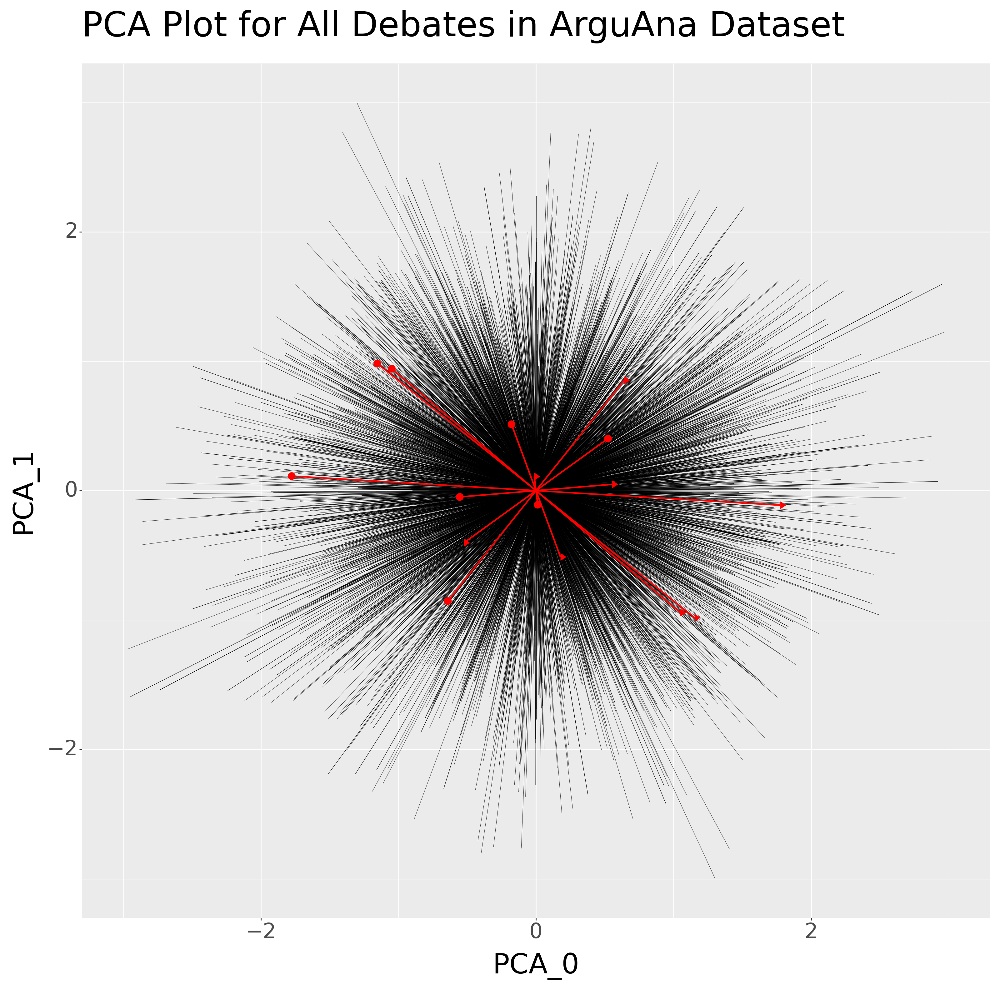

In [ ]:
global_sd_pca_plot_df = loaded_global_sd_pca_df.copy()
global_sd_pca_plot_df['x'] = global_sd_pca_plot_df['pca_0']
global_sd_pca_plot_df['y'] = global_sd_pca_plot_df['pca_1']
global_plot(global_sd_pca_plot_df, TaskType.SEARCH_DOCUMENT)

In [ ]:
global_sq_pca_plot_df = loaded_global_sq_pca_df.copy()
global_sq_pca_plot_df['x'] = global_sq_pca_plot_df['pca_0']
global_sq_pca_plot_df['y'] = global_sq_pca_plot_df['pca_1']
global_plot(global_sq_pca_plot_df, TaskType.SEARCH_QUERY)

NameError: name 'loaded_global_sq_pca_df' is not defined

In [ ]:
global_clu_pca_plot_df = loaded_global_clu_pca_df.copy()
global_clu_pca_plot_df['x'] = global_clu_pca_plot_df['pca_0']
global_clu_pca_plot_df['y'] = global_clu_pca_plot_df['pca_1']
global_plot(global_clu_pca_plot_df, TaskType.CLUSTERING)

In [ ]:
global_cla_pca_plot_df = loaded_global_cla_pca_df.copy()
global_cla_pca_plot_df['x'] = global_cla_pca_plot_df['pca_0']
global_cla_pca_plot_df['y'] = global_cla_pca_plot_df['pca_1']
global_plot(global_cla_pca_plot_df, TaskType.CLASSIFICATION)

<ipython-input-29-7f51de3e4493>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-29-7f51de3e4493>:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/nomic_pca_plots_dump/global-view/global_shuffled_sd_pca_plot.png


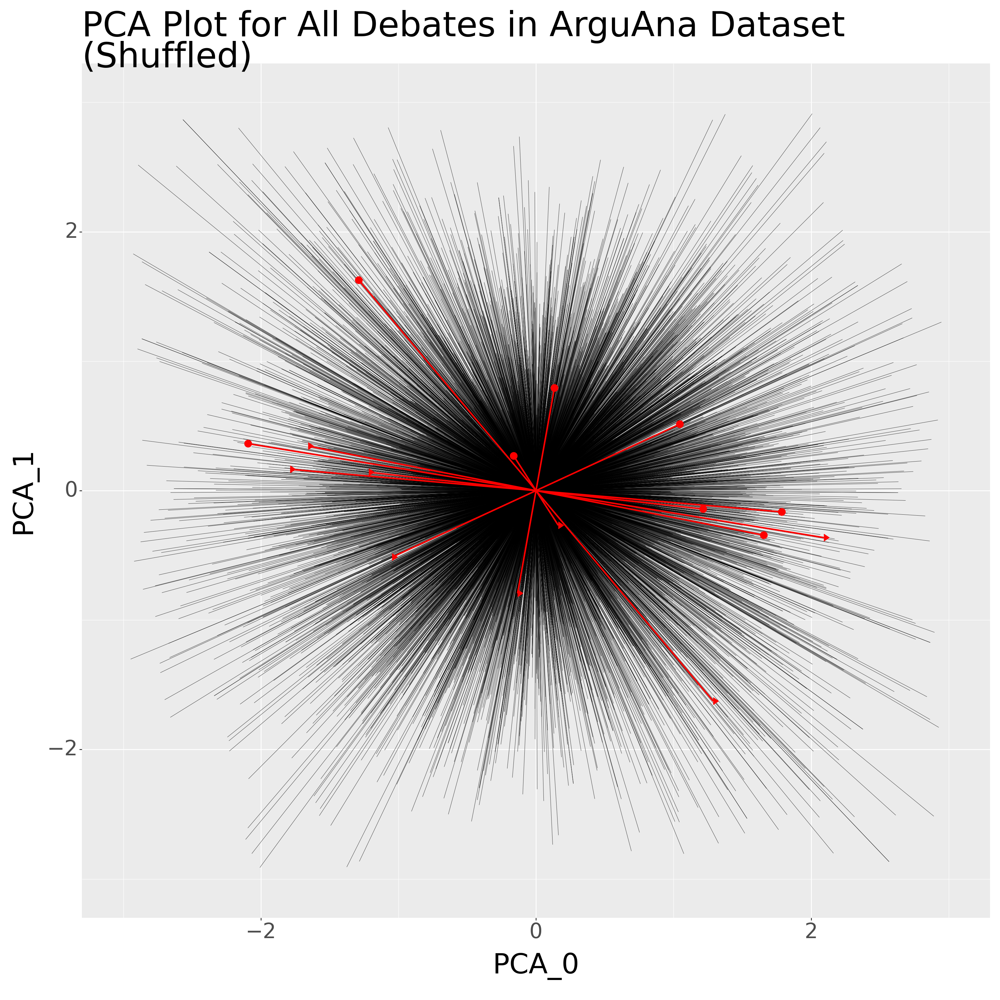

In [ ]:
global_shuffled_pca_plot_df = loaded_shuffled_global_sd_pca_df.copy()
global_shuffled_pca_plot_df['x'] = global_shuffled_pca_plot_df['pca_0']
global_shuffled_pca_plot_df['y'] = global_shuffled_pca_plot_df['pca_1']
global_plot(global_shuffled_pca_plot_df, TaskType.SEARCH_DOCUMENT, file_name='global_shuffled')

### Function for Plotting PCA Object

In [ ]:
def global_pca_object_plot(pca_object: PCA, task_type: TaskType, file_name:str = 'global'):
  pca_obj = pca_object.explained_variance_ratio_
  pca_obj_df = pd.DataFrame({'pca_explained_ratio': pca_obj})
  pca_obj_df['pca_num'] = pca_obj_df.index + 1

  gg = (
    ggplot(pca_obj_df, aes(x='pca_num', y='pca_explained_ratio')) +
    geom_bar(stat="identity") +
    labs(
      title=f'Ratio of Explained Variance for Principal\nComponents 1 to 10 {"(Shuffled)" if not file_name == "global" else ""}'
      ) +
    theme(
      axis_title=element_text(size=32),
      axis_text=element_text(size=24),
      plot_title=element_text(size=36, wrap=True, lineheight=1.5),
      strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
      figure_size=(16, 16)
    ) +
    scale_x_continuous(breaks=list(range(int(pca_obj_df['pca_num'].min()), int(pca_obj_df['pca_num'].max()) + 1)))
  )

  ggsave(gg, f"current-data-dump/pca-plots-dump/nomic_pca_plots_dump/global-view/{file_name}_{task_type.value}_pca_components_plot.png")
  print(gg)

### Load PCA Object

In [ ]:
pca_object_folder_path = "current-data-dump/pca-dump/"
loaded_global_sd_pca_obj = joblib.load(f"{pca_object_folder_path}global_sd_pca_obj.pkl")
loaded_shuffled_global_sd_pca_obj = joblib.load(f"{pca_object_folder_path}global_shuffled_sd_pca_obj.pkl")
loaded_global_sq_pca_obj = joblib.load(f"{pca_object_folder_path}global_sq_pca_obj.pkl")
loaded_global_clu_pca_obj = joblib.load(f"{pca_object_folder_path}global_clu_pca_obj.pkl")
loaded_global_cla_pca_obj = joblib.load(f"{pca_object_folder_path}global_cla_pca_obj.pkl")

### Plot PCA Objects

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/nomic_pca_plots_dump/global-view/global_sd_pca_components_plot.png


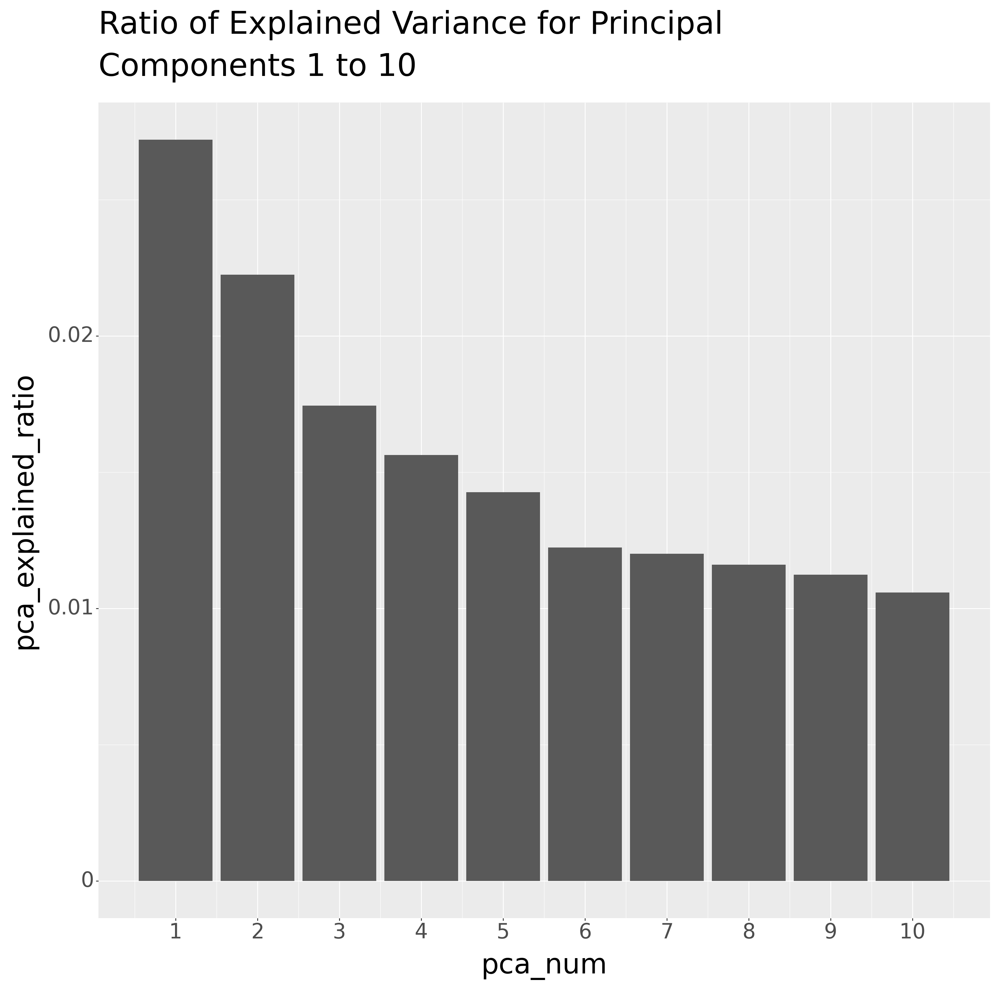

In [ ]:
global_pca_object_plot(loaded_global_sd_pca_obj, TaskType.SEARCH_DOCUMENT)

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/nomic_pca_plots_dump/global-view/global_shuffled_sd_pca_components_plot.png


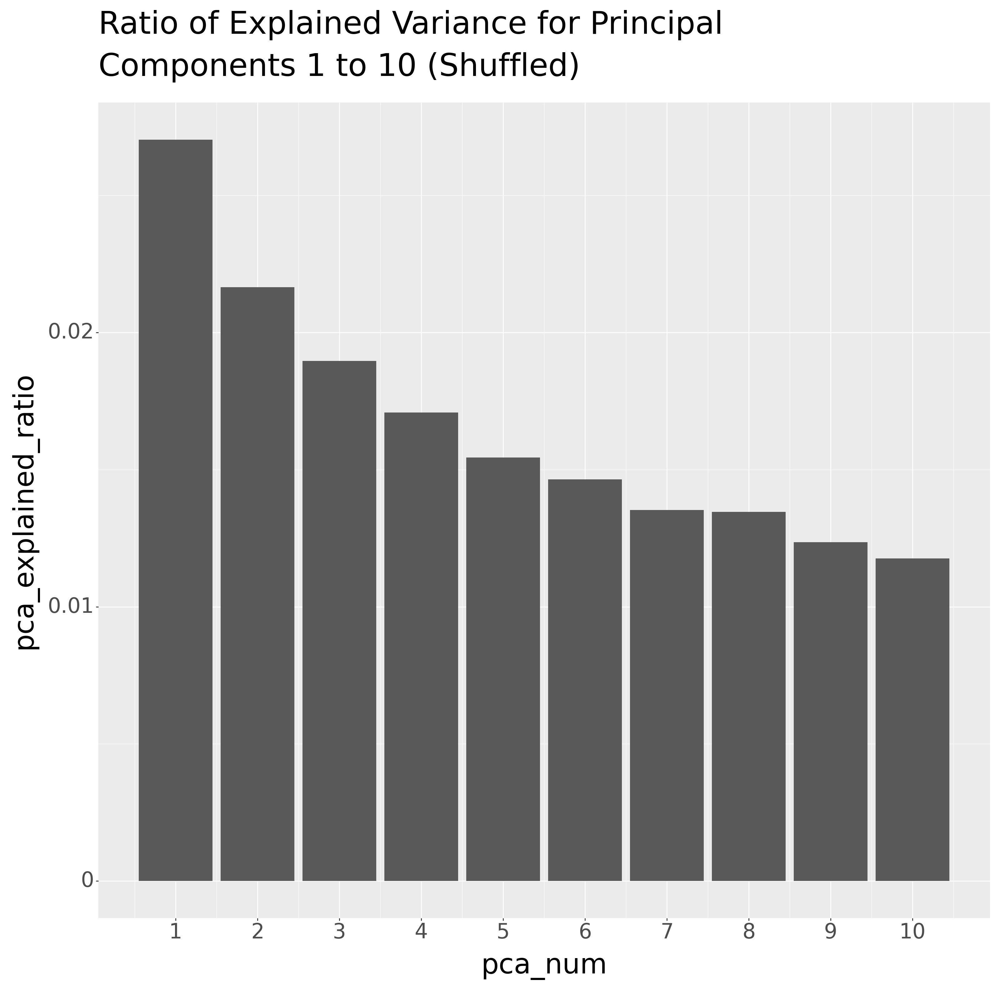

In [ ]:
global_pca_object_plot(loaded_shuffled_global_sd_pca_obj, TaskType.SEARCH_DOCUMENT, file_name='global_shuffled')

In [ ]:
global_pca_object_plot(loaded_global_sq_pca_obj, TaskType.SEARCH_QUERY)

In [ ]:
global_pca_object_plot(loaded_global_clu_pca_obj, TaskType.CLUSTERING)

In [ ]:
global_pca_object_plot(loaded_global_cla_pca_obj, TaskType.CLASSIFICATION)

### Export Plots Dump

In [ ]:
nomic_pca_plots_dump_file_path = 'current-data-dump/pca-plots-dump/nomic_pca_plots_dump'
nomic_pca_plots_dump_file_path_zip = 'current-data-dump/pca-plots-dump/nomic_pca_plots_dump'
shutil.make_archive(nomic_pca_plots_dump_file_path_zip, 'zip', nomic_pca_plots_dump_file_path)
print(f"Zip file created at: {nomic_pca_plots_dump_file_path_zip}")
result = subprocess.run([f"osf -p sakjg upload --force {nomic_pca_plots_dump_file_path_zip}.zip data-dump/nomic-autoencoder/nomic_pca_plots_dump.zip"], shell=True, capture_output=True, text=True)
print(result.stderr)
print(f"File: {nomic_pca_plots_dump_file_path_zip} uploaded at osfstorage")

Zip file created at: current-data-dump/pca-plots-dump/nomic_pca_plots_dump

File: current-data-dump/pca-plots-dump/nomic_pca_plots_dump uploaded at osfstorage


### Import Plots Dump

In [ ]:
subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_pca_plots_dump.zip", shell=True)
print("nomic_pca_plots_dump.zip successfully imported")

nomic_pca_plots_dump_file_path_zip = 'nomic_pca_plots_dump.zip'
nomic_pca_plots_dump_file_path = 'current-data-dump/pca-plots-dump'
with zipfile.ZipFile(nomic_pca_plots_dump_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(nomic_pca_plots_dump_file_path)

extracted_files = os.listdir(nomic_pca_plots_dump_file_path)
print("Files extracted:", extracted_files)